In [1]:
import matplotlib.pyplot as plt
from desc.magnetic_fields import FourierCurrentPotentialField, run_regcoil
from desc.geometry import FourierRZToroidalSurface
from desc.io import load
import numpy as np
from desc.examples import get
from desc.grid import LinearGrid
from desc.plotting import *
from desc.equilibrium import Equilibrium

DESC version 0.11.1+586.ga482be080.dirty,using JAX backend, jax version=0.4.25, jaxlib version=0.4.25, dtype=float64
Using device: CPU, with 3.95 GB available memory


# Poloidal current derivation figure

In [2]:
eq = get("precise_QA")

# create the constant offset surface
surf = eq.surface.constant_offset_surface(offset=0.2, # desired offset
                                          M=16, # Poloidal resolution of desired offset surface
                                          N=12, # Toroidal resolution of desired offset surface
                                          grid=LinearGrid(M=32,N=16,NFP=eq.NFP)) # grid of points on base surface to evaluate unit normal and find points on offset surface,
                                                                                 # generally should be twice the desired resolution

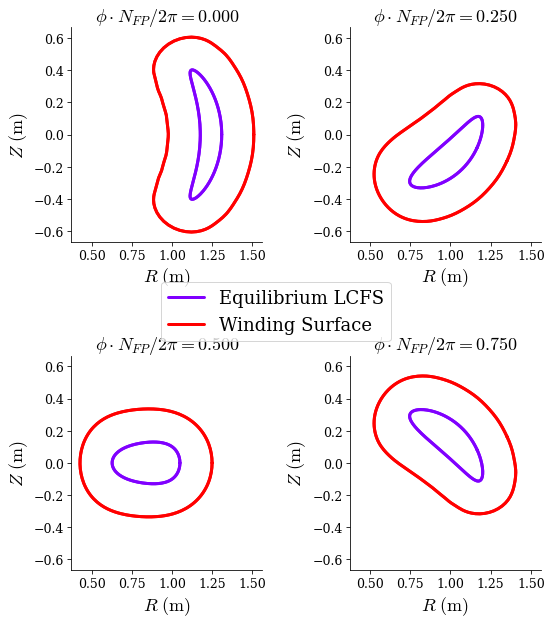

In [3]:
plt.rcParams.update({"font.size":18})
fig,ax=plot_comparison(eqs=[eq,surf],labels=["Equilibrium LCFS","Winding Surface"],phi=np.linspace(0,2*np.pi/eq.NFP,4,endpoint=False),theta=0,rho=1.0,lw=[3],legend_kw={"loc":"center"})
plt.savefig("figures/eq_and_surf_bdry.png")


In [4]:
# run regcoil
field = FourierCurrentPotentialField.from_surface(surf,sym_Phi="sin")
field.change_Phi_resolution(M=12,N=12)
source_grid = LinearGrid(M=45,N=45,NFP=eq.NFP) 
eval_grid = LinearGrid(M=20,N=20,NFP=eq.NFP,sym=True)
field_modular=field

#scan_alphas=np.logspace(-18,-6,20)

field,data = run_regcoil(field,eq,alpha=1e-15,vacuum=True,eval_grid=eval_grid,source_grid=source_grid)
result_modular = data
field_helical=field.copy()
field_helical,result_helical = run_regcoil(field_helical,eq,current_helicity=-1,alpha=1e-15,
                                           vacuum=True,eval_grid=eval_grid,source_grid=source_grid)

Timer: Jacobian Calculation = 11.3 sec
Timer: Jacobian Calculation = 9.39 sec


({'fig_Bn': <Figure size 576.432x576.432 with 2 Axes>,
  'fig_Phi': <Figure size 720.54x720.54 with 2 Axes>},
 {'ax_Bn': <Axes: title={'center': 'Bnormal on plasma surface'}, xlabel='zeta', ylabel='theta'>,
  'ax_Phi': <Axes: title={'center': 'Total Current Potential on winding surface'}, xlabel='zeta', ylabel='theta'>})

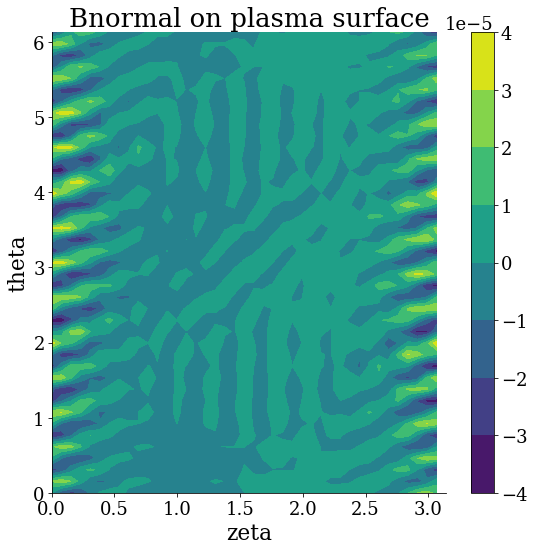

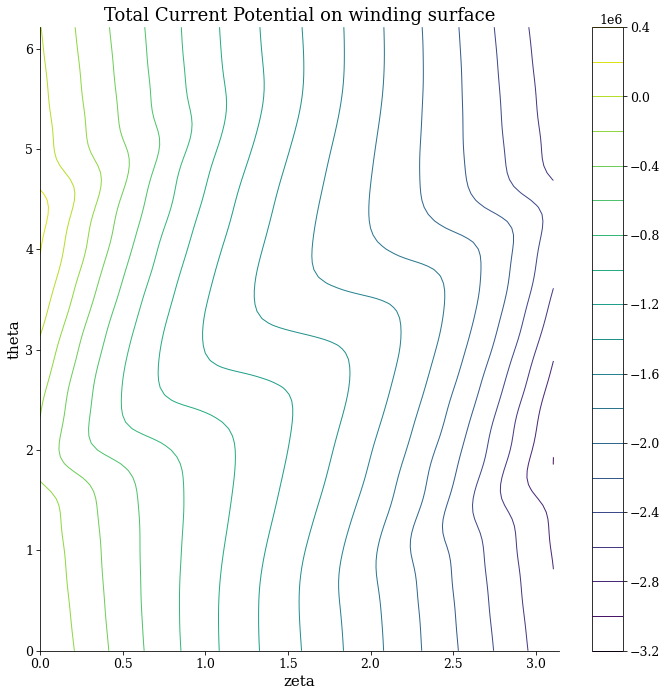

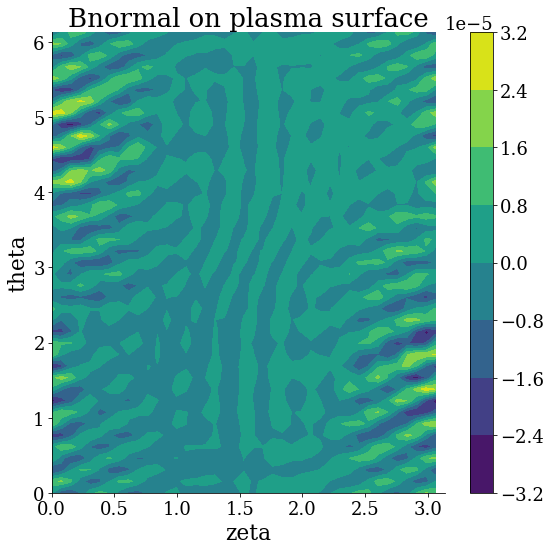

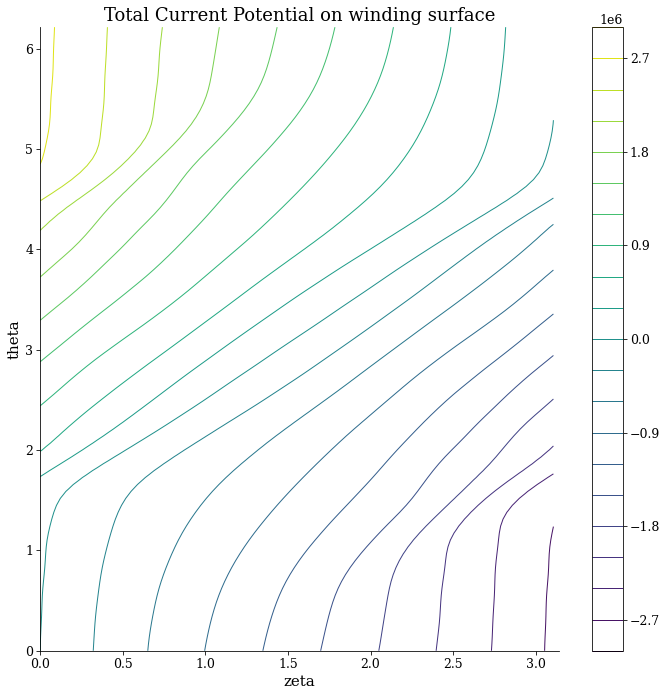

In [5]:
plot_regcoil_outputs(field_modular,data,eq,vacuum=True)
plot_regcoil_outputs(field_helical,result_helical,eq,vacuum=True)


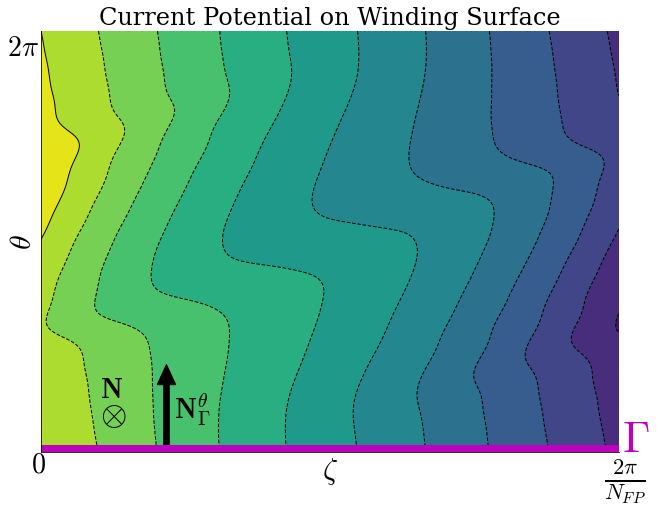

In [6]:
grid = LinearGrid(NFP=eq.NFP,M=80,N=80)
p=field.compute("Phi",grid=grid)["Phi"]
p=p.reshape(grid.num_theta, grid.num_zeta)
plt.rcParams.update({"font.size":36})
plt.figure(figsize=(10,8))
plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=12)
# plt.colorbar()
plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=12,colors=["k"])

plt.xticks([])
plt.yticks([])

plt.xlabel(r"$\zeta$",color="k")
plt.ylabel(r"$\theta$",color="k")

plt.arrow(0.68,0,0,1,head_width=0.1,head_length=0.3,color="k",width=0.03)
plt.text(0.72,0.5,r"$\mathbf{N}_{\Gamma}^{\theta}$",size=28)
plt.text(-0.05,-0.3,r"$0$",size=28,color="k")
plt.text(2*np.pi/eq.NFP-0.1,-0.5,r"$\frac{2\pi}{N_{FP}}$",size=32,color="k")
plt.text(-0.18,2*np.pi-0.4,r"$2\pi$",size=28,color="k")


plt.text(0.32,0.4,r"$\otimes$",size=34)
plt.text(0.32,0.8,r"$\mathbf{N}$",size=28)

plt.axhline(0,c="m",linewidth=15)
plt.text(2*np.pi/eq.NFP,0.0,r"$\Gamma$",size=44,c="m")


plt.title("Current Potential on Winding Surface",color="k",size=24)
plt.savefig("figures/poloidal_current_derivation.png")

In [7]:
# # field=result[0]
# grid = LinearGrid(NFP=eq.NFP,M=80,N=80)
# p=field.compute("Phi",grid=grid)["Phi"]
# p=p.reshape(grid.num_theta, grid.num_zeta)
# plt.rcParams.update({"font.size":28})
# plt.figure(figsize=(8,8))
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=20)
# plt.xticks([])
# plt.yticks([])

# plt.xlabel(r"$\zeta$",color="k")
# plt.ylabel(r"$\theta$",color="k")
# plt.text(0.65,0.4,r"$\mathbf{N}_{\Gamma}^{\theta}$",size=28)
# plt.text(-0.05,-0.3,r"$0$",size=28,color="k")
# plt.text(2*np.pi/eq.NFP-0.1,-0.5,r"$\frac{2\pi}{N_{FP}}$",size=28,color="k")
# plt.text(-0.13,2*np.pi-0.4,r"$2\pi$",size=28,color="k")

# plt.arrow(0.78,0,0,1,head_width=0.05,head_length=0.2,color="k")
# plt.text(0.28,0.4,r"$\otimes$",size=34)
# plt.text(0.22,0.6,r"$\mathbf{N}$",size=28)

# plt.axhline(0,c="m",linewidth=15)
# plt.text(2*np.pi/eq.NFP,0.0,r"$\Gamma$",size=44,c="m")


# plt.title("Current Potential on Winding Surface",color="k",size=24)
# plt.savefig("figures/poloidal_current_derivation.png")

In [8]:
# # field=result[0]
# grid = LinearGrid(NFP=eq.NFP,M=80,N=80)
# p=field.compute("Phi",grid=grid)["Phi"]
# p=p.reshape(grid.num_theta, grid.num_zeta)
# plt.rcParams.update({"font.size":28})
# plt.figure(figsize=(8,8))
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,
#             levels=40)
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,
#             levels=20,linestyles="dashed")

# plt.xticks([])
# plt.yticks([])

# plt.xlabel(r"$\zeta$",color="k")
# plt.ylabel(r"$\theta$",color="k")
# plt.text(0.65,0.4,r"$\mathbf{N}_{\Gamma}^{\theta}$",size=28)
# plt.text(-0.05,-0.3,r"$0$",size=28,color="k")
# plt.text(2*np.pi/eq.NFP-0.1,-0.5,r"$\frac{2\pi}{N_{FP}}$",size=28,color="k")
# plt.text(-0.13,2*np.pi-0.4,r"$2\pi$",size=28,color="k")

# plt.arrow(0.78,0,0,1,head_width=0.05,head_length=0.2,color="k")
# plt.text(0.28,0.4,r"$\otimes$",size=34)
# plt.text(0.22,0.6,r"$\mathbf{N}$",size=28)

# plt.axhline(0,c="m",linewidth=15)
# plt.text(2*np.pi/eq.NFP,0.0,r"$\Gamma$",size=44,c="m")


# plt.title("Current Potential on Winding Surface",color="k",size=24)
# # plt.savefig("figures/poloidal_current_derivation.png")

# difference btwn $\nabla(\theta)$ and $n_{\gamma}^{\theta}$

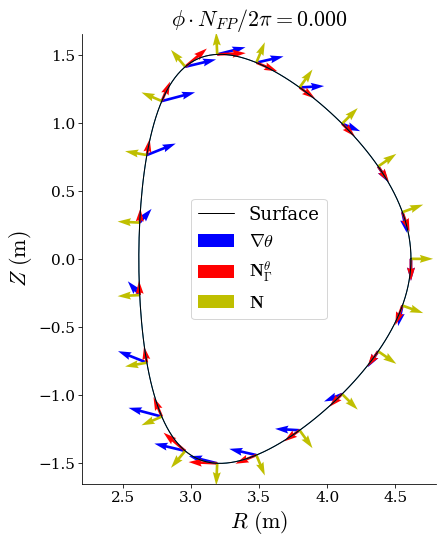

In [9]:
scale=14

plt.rcParams.update({"font.size":22})
eq_axisym = get("DSHAPE")
data = eq_axisym.compute(["R","Z","e^theta","n_rho"],grid=LinearGrid(M=10,sym=False,zeta=0,rho=np.array(1.0)))

fig,ax = plot_surfaces(eq_axisym,theta=0,rho=np.array(1.0),figsize=(8,8),label="Surface",lcfs_color="k")
ax[0].quiver(data["R"],data["Z"],data["e^theta"][:,0],data["e^theta"][:,2],label=r"$\nabla\theta$",scale=scale,color="b")
n_th = data["e^theta"] - (np.sum(data["e^theta"]*data["n_rho"],axis=1)*data["n_rho"].T).T
# n_th =( n_th.T / np.linalg.norm(n_th,axis=-1)).T
ax[0].quiver(data["R"],data["Z"],n_th[:,0],n_th[:,2],color="r",label=r"$\mathbf{N}_{\Gamma}^{\theta}$",scale=scale)
ax[0].quiver(data["R"],data["Z"],data["n_rho"][:,0],data["n_rho"][:,2],color="y",label=r"$\mathbf{N}$",scale=scale+2)
ax[0].set_xlim([2.2,4.8])
ax[0].legend(fontsize=18)
fig=plt.gcf()
fig.savefig("figures/diagram_grad_theta_n_theta.png")

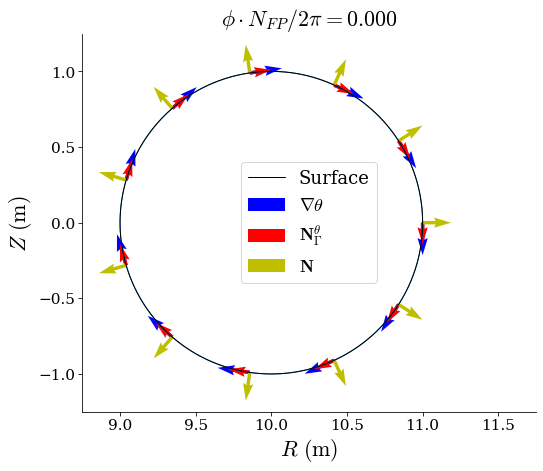

In [10]:
# scale = 10

eq_axisym = Equilibrium()
data = eq_axisym.compute(["R","Z","e^theta","n_rho"],grid=LinearGrid(M=5,sym=False,zeta=0,rho=np.array(1.0)))

fig,ax = plot_surfaces(eq_axisym,theta=0,rho=np.array(1.0),figsize=(8,8),label="Surface",lcfs_color="k")
ax[0].quiver(data["R"],data["Z"],data["e^theta"][:,0],data["e^theta"][:,2],label=r"$\nabla\theta$",scale=scale,color="b")
n_th = data["e^theta"] - (np.sum(data["e^theta"]*data["n_rho"],axis=1)*data["n_rho"].T).T
n_th = n_th* 2/3
# n_th =( n_th.T / np.linalg.norm(n_th,axis=-1)).T
ax[0].quiver(data["R"],data["Z"],n_th[:,0],n_th[:,2],color="r",label=r"$\mathbf{N}_{\Gamma}^{\theta}$",scale=scale)
ax[0].quiver(data["R"],data["Z"],data["n_rho"][:,0],data["n_rho"][:,2],color="y",label=r"$\mathbf{N}$",scale=scale+2)
ax[0].set_xlim([8.75,11.75])
ax[0].set_ylim([-1.25,1.25])

ax[0].legend(fontsize=18)
fig=plt.gcf()
fig.savefig("figures/diagram_grad_theta_n_theta_circular_torus.png")

# figure showing different current helicity and I,G signs

In [11]:
%pdb

Automatic pdb calling has been turned ON


In [12]:
# # import warnings


# plt.rcParams.update({"font.size":36})
# plt.subplots(2,2,figsize=(16,16))
# labels={-1:"-", 1: "+"}

# grid = LinearGrid(M=20,N=20,NFP=1)
# i=1
# for I_sign in [-1,1]:
#     for G_sign in [-1,1]:
#         f = FourierCurrentPotentialField(I=I_sign, G=G_sign)
#         p=f.compute("Phi",grid=grid)["Phi"].reshape(grid.num_theta, grid.num_zeta)
#         plotnum=int(f"22{i}")
#         plt.subplot(plotnum)
#         i+=1
#         plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,
#                 levels=20)
#         # plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,
#         #         levels=20,linewidths=5,vmin=np.min(p),vmax=np.max(p))
#         # if i==3:
#         # plt.colorbar()
#         plt.xlabel(r"$\zeta$",color="k")
#         plt.ylabel(r"$\theta$",color="k")
#         plt.title(f"{labels[I_sign]}I, {labels[G_sign]}G",size=36)
        
#         # nabla Phi text
#         dtheta = I_sign
#         dzeta = G_sign
#         norm = np.sqrt(I_sign**2 + G_sign**2)
#         dtheta = dtheta / norm
#         dzeta = dzeta/norm
#         plt.arrow(3,3,dzeta,dtheta,head_width=0.8,head_length=0.8,color="k",width=0.2)
#         if I_sign==1 and G_sign==1:
#             plt.text(2.5+2*G_sign,2.5+1.5*I_sign,r"$\mathbf{\nabla \Phi}$",size=45)
#         elif I_sign==-1 and G_sign==-1:
#             plt.text(2.5+1*G_sign,2.5+1.5*I_sign,r"$\mathbf{\nabla \Phi}$",size=45)
#         else:
#             plt.text(3+1.5*G_sign,3+1.5*I_sign,r"$\mathbf{\nabla \Phi}$",size=45)
#         # N vector text
#         plt.text(0.32,0.4,r"$\otimes$",size=45)
#         plt.text(0.32,0.8,r"$\mathbf{n}$",size=45)
#         # K Vector text        
#         dzeta = I_sign
#         dtheta = -G_sign
#         norm = np.sqrt(I_sign**2 + G_sign**2)
#         dtheta = dtheta / norm
#         dzeta = dzeta/norm
#         plt.arrow(3,3,dzeta,dtheta,head_width=0.8,head_length=0.8,color="r",width=0.2)
#         if np.sign(I_sign)==np.sign(G_sign):
#             plt.text(1.6-1.3*I_sign,3-G_sign,r"$\mathbf{K} = \mathbf{n} \times \nabla \Phi$",size=45,color="r")
#         else:
#             plt.text(1.75,3-0.5*I_sign,r"$\mathbf{K} = \mathbf{n} \times \nabla \Phi$",size=45,color="r")
# plt.savefig("figures/current_helicities_2d.png")

In [13]:
%pdb

Automatic pdb calling has been turned OFF


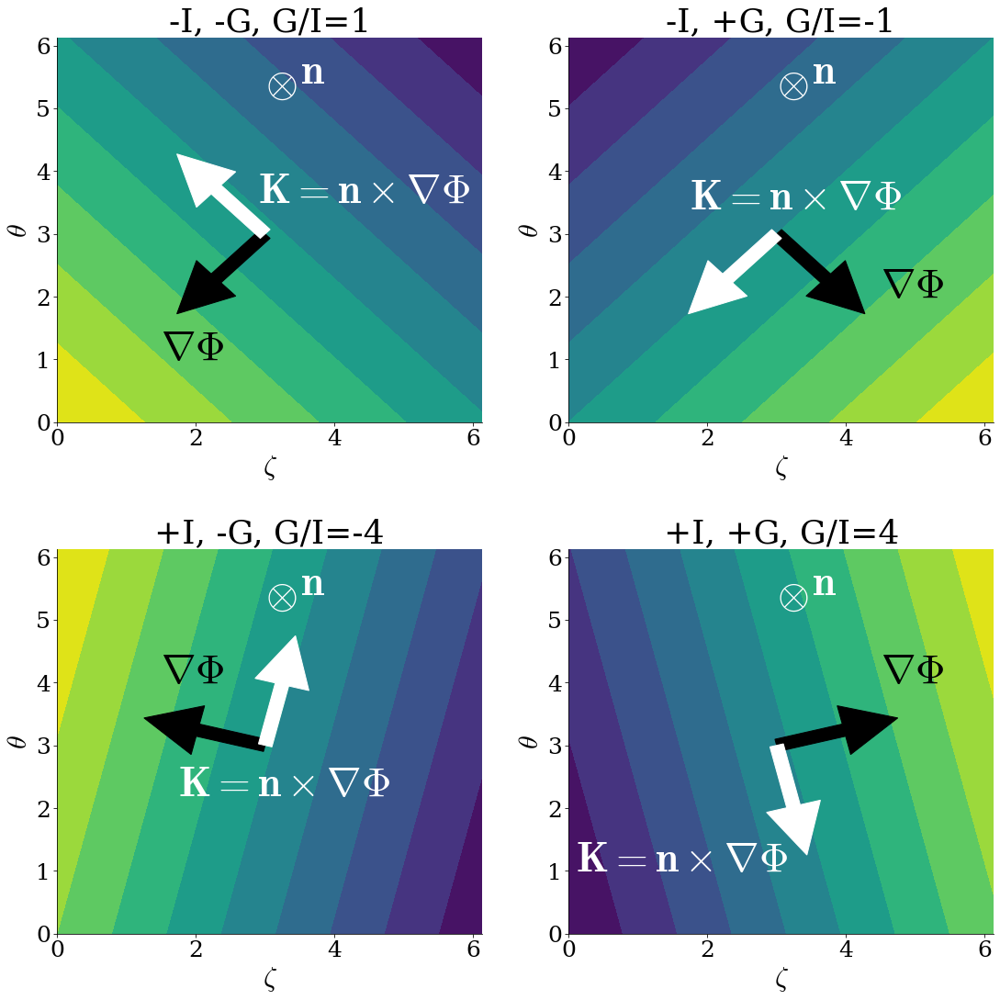

In [14]:
# import warnings


plt.rcParams.update({"font.size":36})
plt.subplots(2,2,figsize=(16,16))
labels={-1:"-", 1: "+"}

grid = LinearGrid(M=20,N=20,NFP=1)
i=1

for I_sign,G_sign in zip([-1,-1,1,1],[-1,1,-4,4]):
    f = FourierCurrentPotentialField(I=I_sign, G=G_sign)
    p=f.compute("Phi",grid=grid)["Phi"].reshape(grid.num_theta, grid.num_zeta)
    plotnum=int(f"22{i}")
    plt.subplot(plotnum)
    i+=1
    plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,
            levels=10)
    # plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,
    #         levels=20,linewidths=5,vmin=np.min(p),vmax=np.max(p))
    # if i==3:
    # plt.colorbar()
    plt.xlabel(r"$\zeta$",color="k")
    plt.ylabel(r"$\theta$",color="k")
    plt.title(f"{labels[I_sign]}I, {labels[round(np.sign(G_sign))]}G, G/I={round(G_sign/I_sign)}",size=36)

    # nabla Phi text
    dtheta = I_sign
    dzeta = G_sign
    norm = np.sqrt(I_sign**2 + G_sign**2)
    dtheta = dtheta / norm
    dzeta = dzeta/norm
    plt.arrow(3,3,dzeta,dtheta,head_width=0.8,head_length=0.8,color="k",width=0.2)
    if I_sign==1 and round(np.sign(G_sign))==1:
        plt.text(2.5+2*np.sign(G_sign),2.5+1.5*I_sign,r"$\mathbf{\nabla \Phi}$",size=45)
    elif I_sign==-1 and round(np.sign(G_sign))==-1:
        plt.text(2.5+1*np.sign(G_sign),2.5+1.5*I_sign,r"$\mathbf{\nabla \Phi}$",size=45)
    else:
        plt.text(3+1.5*np.sign(G_sign),3+1*I_sign,r"$\mathbf{\nabla \Phi}$",size=45)
    # N vector text
    plt.text(3,5.2,r"$\otimes$",size=45,color="w")
    plt.text(3.5,5.4,r"$\mathbf{n}$",size=45,color="w")
    # K Vector text        
    dzeta = I_sign
    dtheta = -G_sign
    norm = np.sqrt(I_sign**2 + G_sign**2)
    dtheta = dtheta / norm
    dzeta = dzeta/norm
    curr_color="w"
    plt.arrow(3,3,dzeta,dtheta,head_width=0.8,head_length=0.8,color=curr_color,width=0.2)
    if np.sign(I_sign)==np.sign(G_sign):
        plt.text(1.5-1.4*I_sign,3-G_sign/2,r"$\mathbf{K} = \mathbf{n} \times \nabla \Phi$",size=45,color=curr_color)
    else:
        plt.text(1.75,2.8+0.6*np.sign(G_sign),r"$\mathbf{K} = \mathbf{n} \times \nabla \Phi$",size=45,color=curr_color)
plt.savefig("figures/current_helicities_2d.png")

In [15]:
dtheta

-0.9701425001453319

In [16]:
dzeta

0.24253562503633297

In [17]:
# eqq = Equilibrium(surface=FourierRZToroidalSurface(R_lmn=[1,0.5],modes_R=[[0,0],[1,0]], Z_lmn=[-0.5],modes_Z=[[-1,0]]))
# grid = LinearGrid(M=80,N=80,NFP=1,rho=0.9,endpoint=True)
# fig = plot_3d(eqq,"R",grid=grid,figsize=(10,10))

# labels={-1:"-", 1: "+"}
# cs={-1:"cyan",1:"black"}
# i=1
# for I_sign in [1]:
#     for G_sign in [-1,1]:
#         f = FourierCurrentPotentialField.from_surface(surface=eqq.surface,I=I_sign, G=G_sign)
#         coils = f.cut_surface_current_into_coils(5)
#         fig = plot_coils(coils,color=cs[G_sign],fig=fig,lw=5)
        
# fig.show()
# # plt.savefig("figures/current_helicities_2d.png")

# helical coil contours figure

In [18]:
# field=field_helical

# grid = LinearGrid(NFP=eq.NFP,M=80,N=80)
# p=field.compute("Phi",grid=grid)["Phi"]
# p=p.reshape(grid.num_theta, grid.num_zeta)
# plt.rcParams.update({"font.size":28})
# plt.figure(figsize=(10,8))
# levels = np.flip(np.linspace(field.I,field.G/eq.NFP,10))
# plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels)
# # coil contours
# ind=6
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=[levels[ind]],colors=["r"],linewidths=[5],labels=["Coil"])
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels,colors=["r"],linewidths=[1],linestyles="solid")
# # halfway contours
# levels_half = levels+0.5*(levels[1]-levels[0])
# # plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_half[4:6],colors=["k"],linewidths=[5],labels=["Halfway Contour"],linestyles="dashed")
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_half,colors=["k"],linewidths=[1],linestyles="dashed")


# plt.xticks([])
# plt.yticks([])

# plt.xlabel(r"$\zeta$",color="k")
# plt.ylabel(r"$\theta$",color="k")
# # plt.text(0.65,0.4,r"$\mathbf{N}_{\Gamma}^{\theta}$",size=28)
# # plt.text(-0.05,-0.3,r"$0$",size=28,color="k")
# # plt.text(2*np.pi/eq.NFP-0.1,-0.5,r"$\frac{2\pi}{N_{FP}}$",size=28,color="k")
# # plt.text(-0.13,2*np.pi-0.4,r"$2\pi$",size=28,color="k")

# # plt.arrow(0.78,0,0,1,head_width=0.05,head_length=0.2,color="k")
# # plt.text(0.28,0.4,r"$\otimes$",size=34)
# # plt.text(0.22,0.6,r"$\mathbf{N}$",size=28)
# plt.plot([1,1],[1,1],"r-",label=r"$\Phi$ Contour (Coil)")
# plt.plot([1,1],[1,1],"k--",label=r"Halfway $\Phi$ Contour")
# plt.legend(loc="lower right",fontsize=18)
# plt.annotate(r"$[$",fontsize=82,
#             xy=(-0.06, 0.05),  xycoords="axes fraction"
#             )
# # plt.axvline(-0.01,c="m",linewidth=15,ymax=0.18)
# plt.text(-0.52,0.35,r"$I_{coil}=\Delta \Phi$",size=32,c="m")


# plt.title("Current Potential on Winding Surface",color="k",size=24)
# # plt.savefig("figures/poloidal_current_derivation.png")

/var/folders/_2/0q3by2q141q8gwknwp9q87lm0000gp/T/ipykernel_31112/3063997495.py:25: UserWarning: The following kwargs were not used by contour: 'labels'
  plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=[levels[ind]],colors=[coilcolor],linewidths=[5],labels=["Coil"])


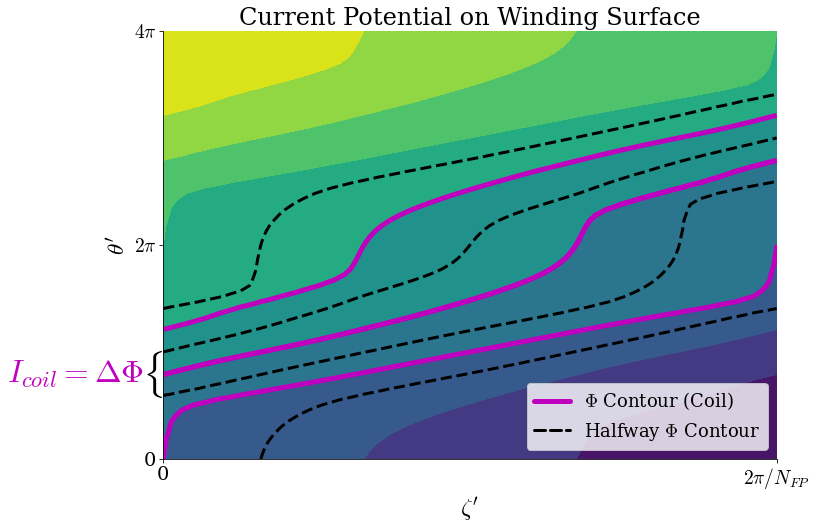

In [19]:
field=field_helical

npts=80
thetas = np.linspace(0,2*np.pi*2,npts)
zetas = np.linspace(0,2*np.pi/eq.NFP,npts)
thetas, zetas = np.meshgrid(thetas,zetas,indexing="xy")
thetas = thetas.flatten("F")
zetas = zetas.flatten("F")

from desc.grid import Grid
grid = Grid(np.vstack([np.ones_like(zetas),thetas,zetas]).T)
p=field.compute("Phi",grid=grid)["Phi"]
p=p.reshape(grid.num_theta, grid.num_zeta)
plt.rcParams.update({"font.size":28})
plt.figure(figsize=(12,8))
levels = np.flip(np.linspace(2*field.I,field.G/eq.NFP,10))
plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels)
# plt.colorbar()

# coil contours
top_ind=3
bot_ind=6
ind=4
coilcolor="m"
plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=[levels[ind]],colors=[coilcolor],linewidths=[5],labels=["Coil"])
plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels[top_ind:bot_ind],colors=[coilcolor],linewidths=[5],linestyles="solid")
# halfway contours
levels_half = levels+0.5*(levels[1]-levels[0])

plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_half[top_ind-1:bot_ind],colors=["k"],linewidths=[3],linestyles="dashed")



locs,labels=plt.yticks()
xlocs,xlabels=plt.xticks()

plt.yticks(np.append(locs[0],[2*np.pi,4*np.pi]), ["0",r"$2\pi$",r"$4\pi$"])
plt.xticks(np.append(xlocs[0],2*np.pi/eq.NFP), ["0",r"$2\pi/{N_{FP}}$"])



plt.xlabel(r"$\zeta'$",color="k")
plt.ylabel(r"$\theta'$",color="k")

plt.plot([1,1],[1,1],f"{coilcolor}-",label=r"$\Phi$ Contour (Coil)",lw=5)
plt.plot([1,1],[1,1],"k--",label=r"Halfway $\Phi$ Contour",lw=3)
plt.legend(loc="lower right",fontsize=18)
plt.annotate(r"$\{$",fontsize=40,
            xy=(-0.035, 0.165),  xycoords="axes fraction"
            )
# plt.axvline(-0.01,c="m",linewidth=15,ymax=0.18)
plt.text(-0.80,2.25,r"$I_{coil}=\Delta \Phi$",size=32,c=coilcolor)


plt.title("Current Potential on Winding Surface",color="k",size=24)
plt.savefig("figures/coil_contours_helical.png")

# modular coil contours figure

/var/folders/_2/0q3by2q141q8gwknwp9q87lm0000gp/T/ipykernel_31112/437934654.py:28: UserWarning: The following kwargs were not used by contour: 'labels'
  plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=[levels_to_plot_coils[ind]],colors=[coilcolor],linewidths=[5],labels=["Coil"])


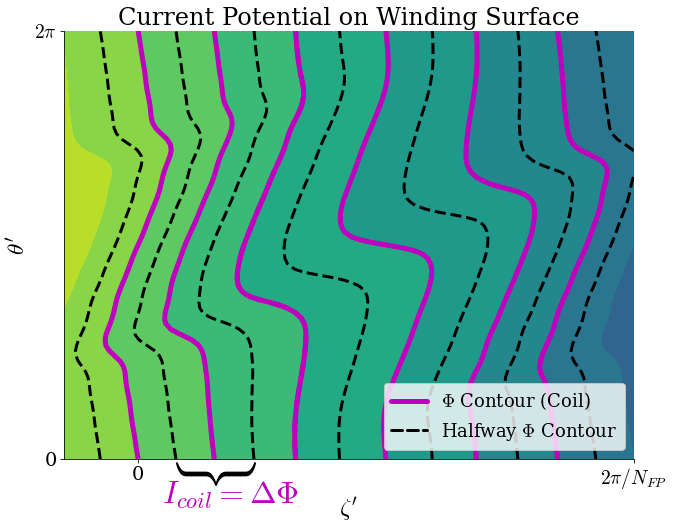

In [20]:
field=field_modular

npts=80
thetas = np.linspace(0,2*np.pi,npts)
zetas = np.linspace(-0.15*2*np.pi/eq.NFP,2*np.pi/eq.NFP,npts)
thetas, zetas = np.meshgrid(thetas,zetas,indexing="xy")
thetas = thetas.flatten("F")
zetas = zetas.flatten("F")
grid = Grid(np.vstack([np.ones_like(zetas),thetas,zetas]).T)

Ncoils=6

p=field.compute("Phi",grid=grid)["Phi"]
p=p.reshape(grid.num_theta, grid.num_zeta)
plt.rcParams.update({"font.size":28})
plt.figure(figsize=(10,8))
levels = np.flip(np.linspace(-field.G/eq.NFP*0.1,1.1*field.G/eq.NFP,Ncoils))
levels_to_plot_contourf = np.flip(np.arange(-3*field.G/eq.NFP/Ncoils,2*field.G/eq.NFP,field.G/eq.NFP/Ncoils))
levels_to_plot_coils = np.flip(np.arange(-1,1.01*field.G/eq.NFP,field.G/eq.NFP/Ncoils))

plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_to_plot_contourf)
# plt.colorbar()
# coil contours
top_ind=1
bot_ind=None
ind=4
coilcolor="m"
plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=[levels_to_plot_coils[ind]],colors=[coilcolor],linewidths=[5],labels=["Coil"])
plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_to_plot_coils[top_ind:bot_ind],colors=[coilcolor],linewidths=[5],linestyles="solid")
# halfway contours
levels_half = levels_to_plot_coils+0.5*(levels_to_plot_coils[1]-levels_to_plot_coils[0])

plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_half[top_ind-1:bot_ind],colors=["k"],linewidths=[3],linestyles="dashed")



locs,labels=plt.yticks()
xlocs,xlabels=plt.xticks()

plt.yticks(np.append(locs[0],np.max(grid.nodes[:,1])), ["0",r"$2\pi$"])
plt.xticks(np.append(np.array([0.0]),np.max(grid.nodes[:,2])), ["0",r"$2\pi/{N_{FP}}$"])


plt.xlabel(r"$\zeta'$",color="k")
plt.ylabel(r"$\theta'$",color="k")

plt.plot([1,1],[1,1],f"{coilcolor}-",label=r"$\Phi$ Contour (Coil)",lw=5)
plt.plot([1,1],[1,1],"k--",label=r"Halfway $\Phi$ Contour",lw=3)
plt.legend(loc="lower right",fontsize=18)
plt.annotate(r"$\{$",fontsize=65,
            xy=(0.195, -0.039),  xycoords="axes fraction",rotation=90
            )
# plt.axvline(-0.01,c="m",linewidth=15,ymax=0.18)
plt.text(0.15,-0.65,r"$I_{coil}=\Delta \Phi$",size=32,c=coilcolor)

# plt.text(-1.45,2.25,r"$I_{coil}=\Delta \Phi$",size=32,c="w")


plt.title("Current Potential on Winding Surface",color="k",size=24)
plt.savefig("figures/coil_contours_modular.png")

# Modular coil figure

In [21]:
field=field_modular
coils_modular = field.to_CoilSet(24,step=2)

from desc.plotting import *
figsize=(10,10)
fig=plot_3d(eq.surface,"B*n",field=coils_modular,figsize=figsize,zeroline=False,showgrid=False)
fig=plot_coils(coils_modular,fig=fig,figsize=figsize)
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
        xaxis_title=' ',
        yaxis_title=' ',
        zaxis_title=' ',
    ),
)
fig.show()
fig.write_image("figures/modular_coils.png")



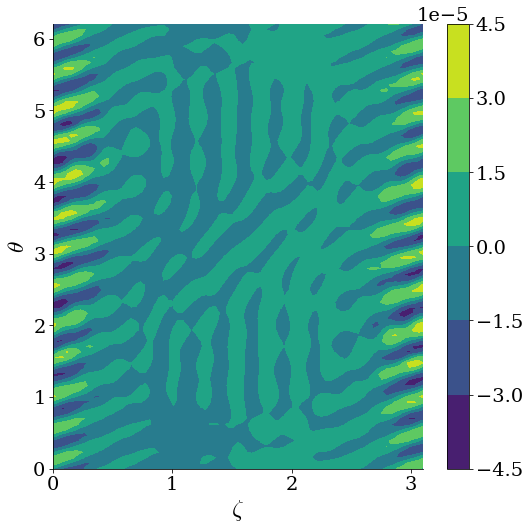

In [22]:
# Bn from surf current
grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
Bn,_ = field.compute_Bnormal(eq.surface,eval_grid=eval_grid,source_grid=grid)

th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")


plt.savefig("figures/Bn_surf_current_modular.png")



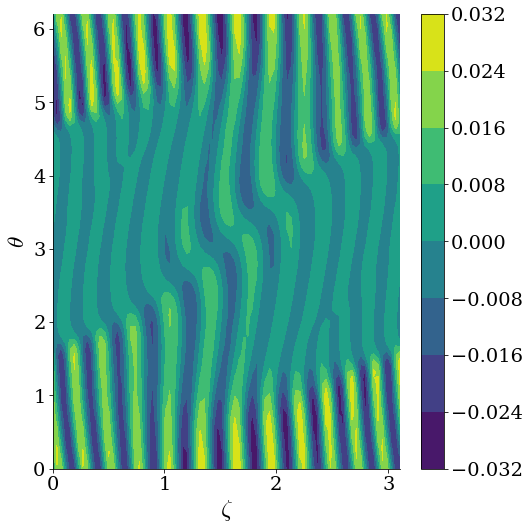

In [23]:
# Bn from coils
# grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
Bn,_ = coils_modular.compute_Bnormal(eq.surface,eval_grid=eval_grid)

th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")


plt.savefig("figures/Bn_coils_modular.png")



# Helical coil figure

In [24]:
field=field_helical
coils_helical = field.to_CoilSet(16)

In [25]:
from desc.plotting import *
figsize=(10,10)
fig=plot_3d(eq.surface,"B*n",field=coils_helical,figsize=figsize,zeroline=False,showgrid=False)

# colors=["black","cyan","darkmagenta"]*2
# for coi,col in zip(coils_helical,colors):
#     fig=plot_coils(coi,fig=fig,color=col,figsize=figsize)
fig=plot_coils(coils_helical,fig=fig,figsize=figsize)
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
        xaxis_title=' ',
        yaxis_title=' ',
        zaxis_title=' ',
    ),
)
fig.show()
fig.write_image("figures/helical_coils.png")

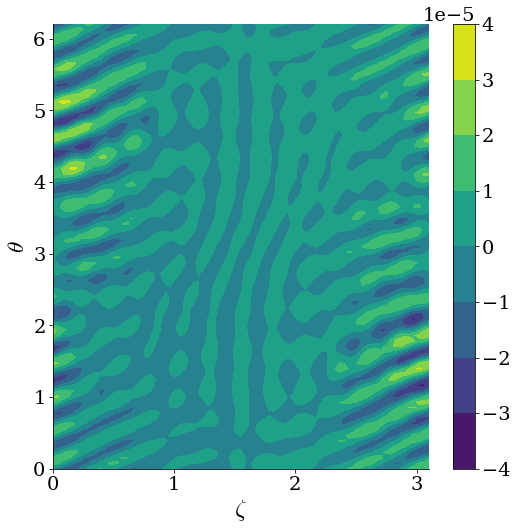

In [26]:
# Bn from surf current
grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
Bn,_ = field.compute_Bnormal(eq.surface,eval_grid=eval_grid,source_grid=grid)

th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")


plt.savefig("figures/Bn_surf_current_helical.png")






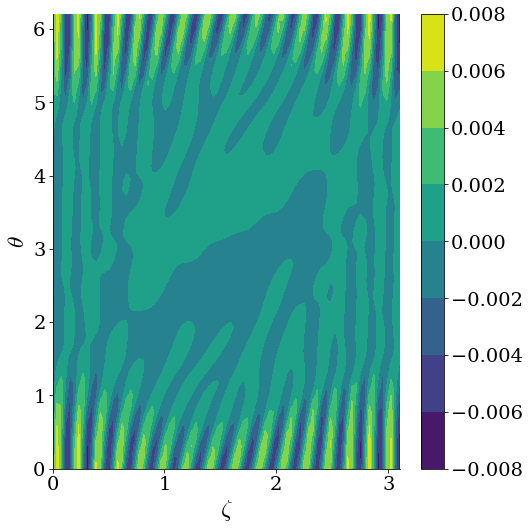

In [27]:
# Bn from helical coils
# grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
Bn,_ = coils_helical.compute_Bnormal(eq.surface,eval_grid=eval_grid)

th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")



plt.savefig("figures/Bn_coils_helical.png")





Text(0.5, 1.0, 'Phi')

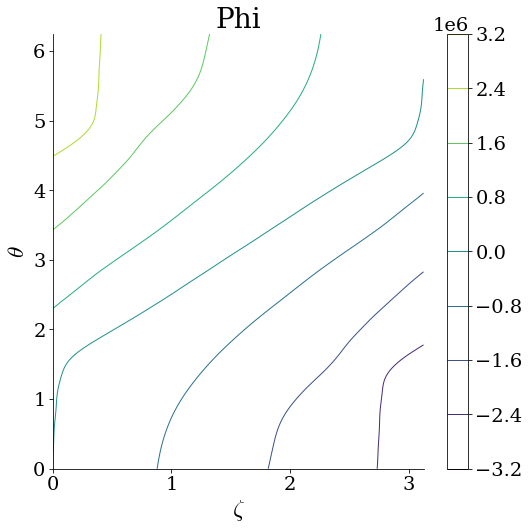

In [28]:
# Bn from surf current
grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = grid
phi = field.compute("Phi",grid=grid)["Phi"]
th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contour(ze,th, phi.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")
plt.title("Phi")



# modular field trace

Bn calc took 2.220e+00 seconds
normalized average <Bn> = 0.009296704982519251


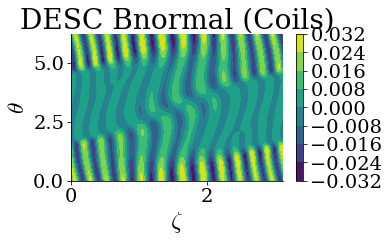

In [29]:
import time
grid = LinearGrid(M=80,N=80,NFP=eq.NFP)
t1=time.time()
Bn,_=coils_modular.compute_Bnormal(eq.surface,eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(grid.nodes[grid.unique_zeta_idx,2],grid.nodes[grid.unique_theta_idx,1],Bn.reshape((grid.num_zeta, grid.num_theta)).T)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()

print(f"normalized average <Bn> = {np.mean(np.abs(Bn) / eq.compute('|B|',grid=grid)['|B|'])}")

Bn calc took 7.308e-01 seconds


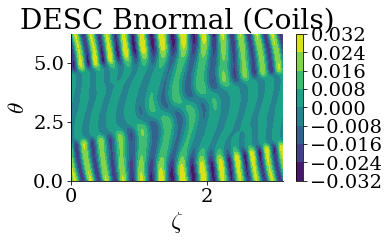

In [30]:
# fitting with a Fourier series will make the magnetic field computation more computationally efficient
cset = coils_modular.to_FourierXYZ(N=30)
t1=time.time()
Bn,_=cset.compute_Bnormal(eq.surface,eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(grid.nodes[grid.unique_zeta_idx,2],grid.nodes[grid.unique_theta_idx,1],Bn.reshape((grid.num_zeta, grid.num_theta)).T)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()

(<Figure size 432.324x432.324 with 1 Axes>,
 <Axes: xlabel='$R ~(\\mathrm{m})$', ylabel='$Z ~(\\mathrm{m})$'>)

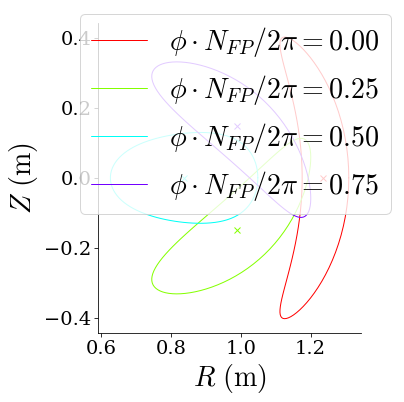

In [31]:
plot_boundary(eq)

In [32]:
# Field line integration (on a CPU this can take a few minutes)
from desc.magnetic_fields import field_line_integrate
rho = np.linspace(0,1,10,endpoint=True)

ntransit = 200
r0 = eq.compute("R",grid=LinearGrid(rho=rho,M=0,N=0,NFP=eq.NFP))["R"]
#r0 = np.linspace(1.16,1.25,20)
phis = np.arange(0, ntransit * 2 * np.pi + 1, 2 * np.pi)
t1 = time.time()
fieldR, fieldZ = field_line_integrate(
    r0=r0,
    z0=np.zeros_like(r0),
    phis=phis,
    field=cset,
    bounds_R = (0.5,1.5),
    bounds_Z=(-1,1)
)
print(f"field line integration took {time.time()-t1:1.3e} seconds")
# old field line integration took 6.373e+02 seconds

field line integration took 5.850e+01 seconds


/Users/dpanici/Research/DESC/desc/utils.py:495: FutureWarning:

argument zeta has been renamed to phi, zeta will be removed in a future release



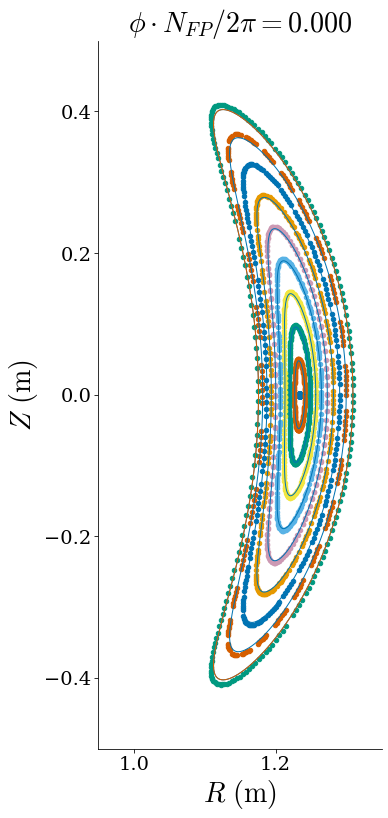

In [33]:
import matplotlib.pyplot as plt
fig,ax = plot_surfaces(eq,zeta=np.array(0.0),theta=0,figsize=(12,12),rho=rho)
for i in range(fieldR.shape[1]):
    ax[0].scatter(fieldR[:,i],fieldZ[:,i],s=20)

plt.xlim([0.95,1.35])
plt.ylim([-0.5,0.5])
plt.savefig("figures/field_trace_modular.png")

# helical coil field trace

Bn calc took 3.711e+00 seconds
normalized average <Bn> = 0.0012041180982405068


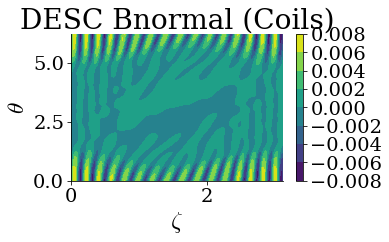

In [34]:
import time
grid = LinearGrid(M=80,N=80,NFP=eq.NFP)
t1=time.time()
Bn,_=coils_helical.compute_Bnormal(eq.surface,eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(grid.nodes[grid.unique_zeta_idx,2],grid.nodes[grid.unique_theta_idx,1],Bn.reshape((grid.num_zeta, grid.num_theta)).T)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()

print(f"normalized average <Bn> = {np.mean(np.abs(Bn) / eq.compute('|B|',grid=grid)['|B|'])}")

Bn calc took 4.489e-01 seconds


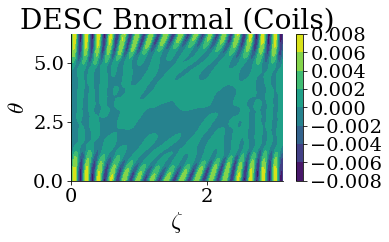

In [35]:
# fitting with a Fourier series will make the magnetic field computation more computationally efficient
cset = coils_helical.to_FourierXYZ(N=40)
t1=time.time()
Bn,_=cset.compute_Bnormal(eq.surface,eval_grid=grid)
print(f"Bn calc took {time.time()-t1:1.3e} seconds")
plt.figure()
plt.contourf(grid.nodes[grid.unique_zeta_idx,2],grid.nodes[grid.unique_theta_idx,1],Bn.reshape((grid.num_zeta, grid.num_theta)).T)
plt.title("DESC Bnormal (Coils)")
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")

plt.colorbar()

In [36]:
# Field line integration (on a CPU this can take a few minutes)
from desc.magnetic_fields import field_line_integrate
rho = np.linspace(0,1,10,endpoint=True)
ntransit = 200
r0 = eq.compute("R",grid=LinearGrid(rho=rho,M=0,N=0,NFP=eq.NFP))["R"]
phis = np.arange(0, ntransit * 2 * np.pi + 1, 2 * np.pi)
t1 = time.time()
fieldR, fieldZ = field_line_integrate(
    r0=r0,
    z0=np.zeros_like(r0),
    phis=phis,
    field=cset,
    # bounds_R = (0.3,1.8),
    # bounds_Z=(-1,1)
)
print(f"field line integration took {time.time()-t1:1.3e} seconds")

field line integration took 4.480e+01 seconds


/Users/dpanici/Research/DESC/desc/utils.py:495: FutureWarning:

argument zeta has been renamed to phi, zeta will be removed in a future release



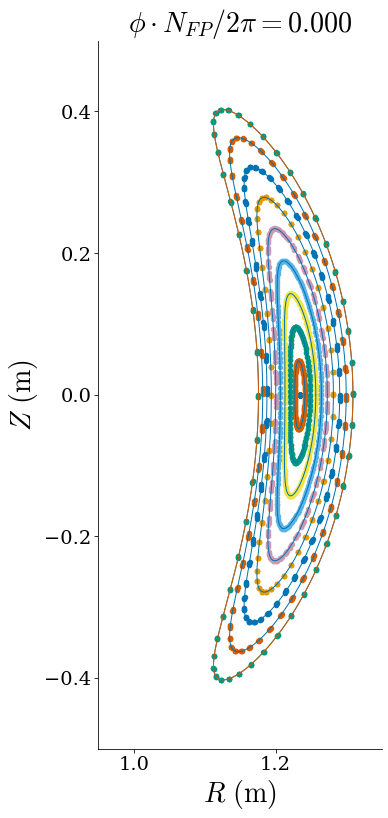

In [37]:
fig,ax = plot_surfaces(eq,zeta=np.array(0.0),theta=0,figsize=(12,12),rho=rho)
for i in range(fieldR.shape[1]):
    ax[0].scatter(fieldR[:,i],fieldZ[:,i],s=20)

plt.xlim([0.95,1.35])
plt.ylim([-0.5,0.5])
plt.savefig("figures/field_trace_helical.png")